# Latent Diffusion Models

In the last few month, latent diffusion models (LDM) became increasingly popular. Dall-E2 Stable Diffusion, Imagen, and many other models have shown incredbile text-to-image capabilities.
Today we're going to understand how they work, and see how we can use LDMs with Keras. We'll focus on the example of Stable Diffusion.

## Stable Diffusion

It's very complicated!

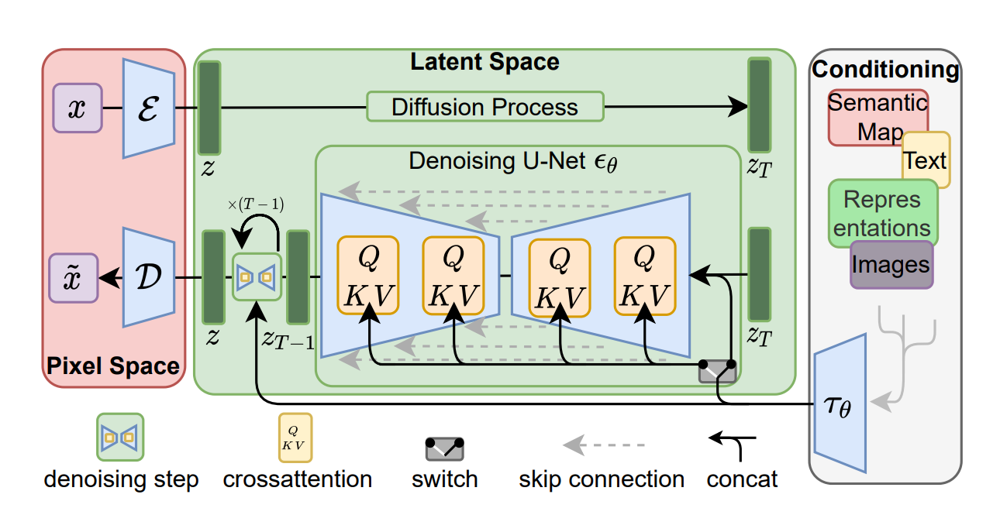

The model is composed of three main steps:

1. Text encoding (embedding)
2. Diffusion process (generation)
3. Upsampling (back to images)

## Generative diffusion models (without text)

We'll start with a diffusion example first, unrelated to Stable Diffusion.

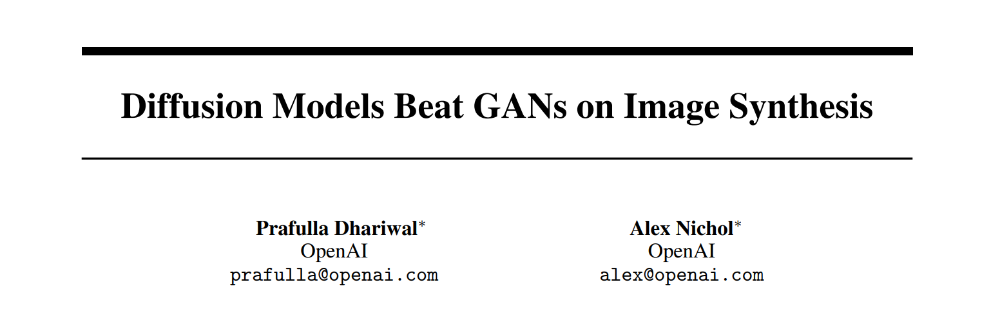

Definition of diffusion process:

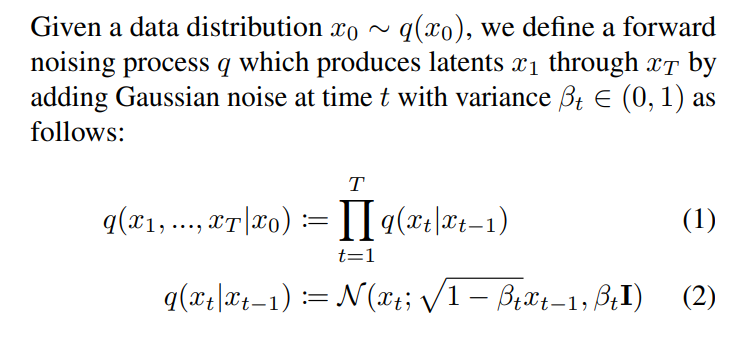

Essentially, we add noise at each timestep:

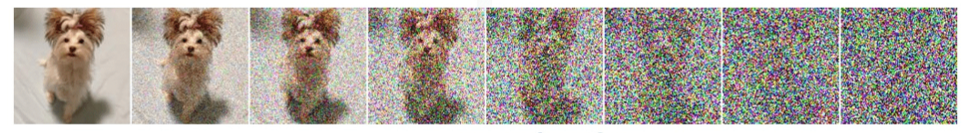

We can also use different schedules for the noise (choice of $\beta_t$):

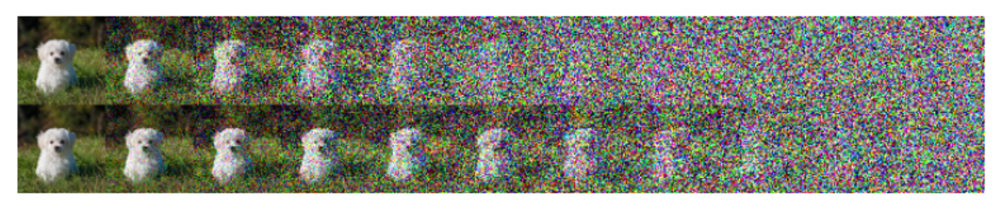

[source](https://www.google.com/url?sa=i&url=https%3A%2F%2Ftheaisummer.com%2Fdiffusion-models%2F&psig=AOvVaw2HcgwrwhgtEBSS2wxLRJuI&ust=1673979058312000&source=images&cd=vfe&ved=0CBEQjhxqFwoTCKig-6HYzPwCFQAAAAAdAAAAABAD)

We want to train a model, such that given a noisy image $x_t$, it can predict the previous noisy image $x_{t-1}$.

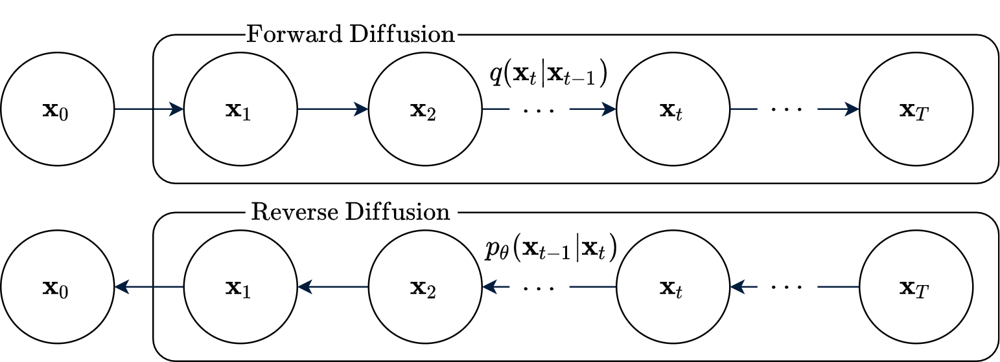

[source](https://www.google.com/url?sa=i&url=https%3A%2F%2Fayandas.me%2Fblog-tut%2F2021%2F12%2F04%2Fdiffusion-prob-models.html&psig=AOvVaw3_PkvbAIL3L_vCavcvWVjh&ust=1674034390446000&source=images&cd=vfe&ved=0CBEQjhxqFwoTCKjg45umzvwCFQAAAAAdAAAAABAI)

## CLIP

Now that we understand how diffusion models generate data, we can try to undersstand how to add text.

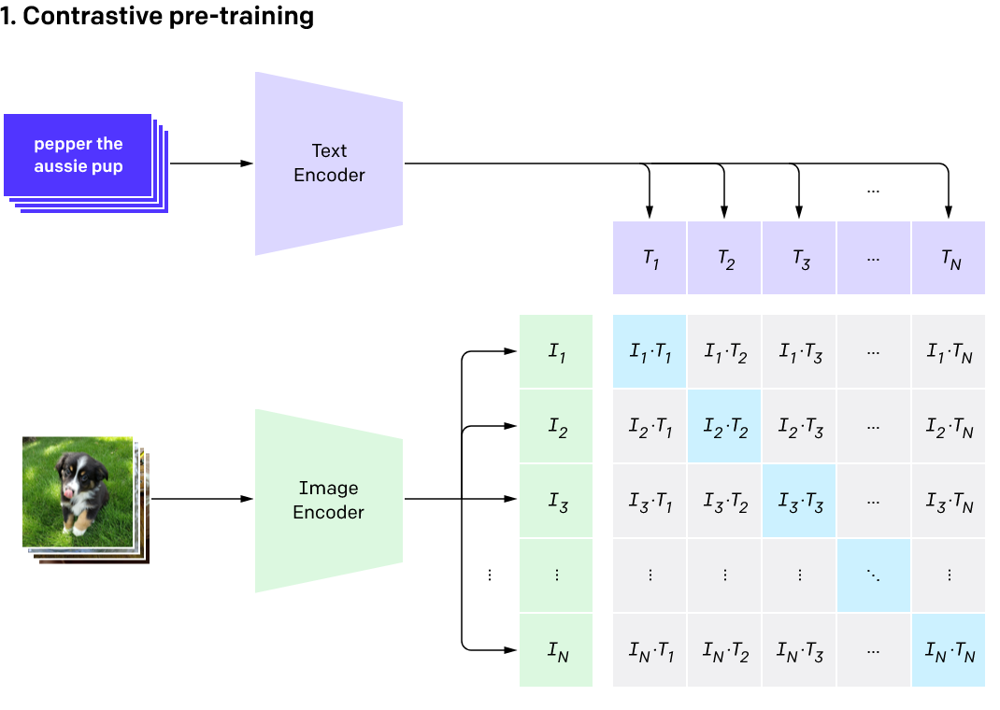

[source](https://www.google.com/url?sa=i&url=https%3A%2F%2Fopenai.com%2Fblog%2Fclip%2F&psig=AOvVaw1EuQiLcWwMyP3Vn59lAI2Y&ust=1674038490217000&source=images&cd=vfe&ved=0CBEQjhxqFwoTCOijlr-1zvwCFQAAAAAdAAAAABAD)

Clip encodes image and textual together. That is to say, all images and sentences are embedded to two vectors. We can check their similarity using metrics such as cosine similarity.

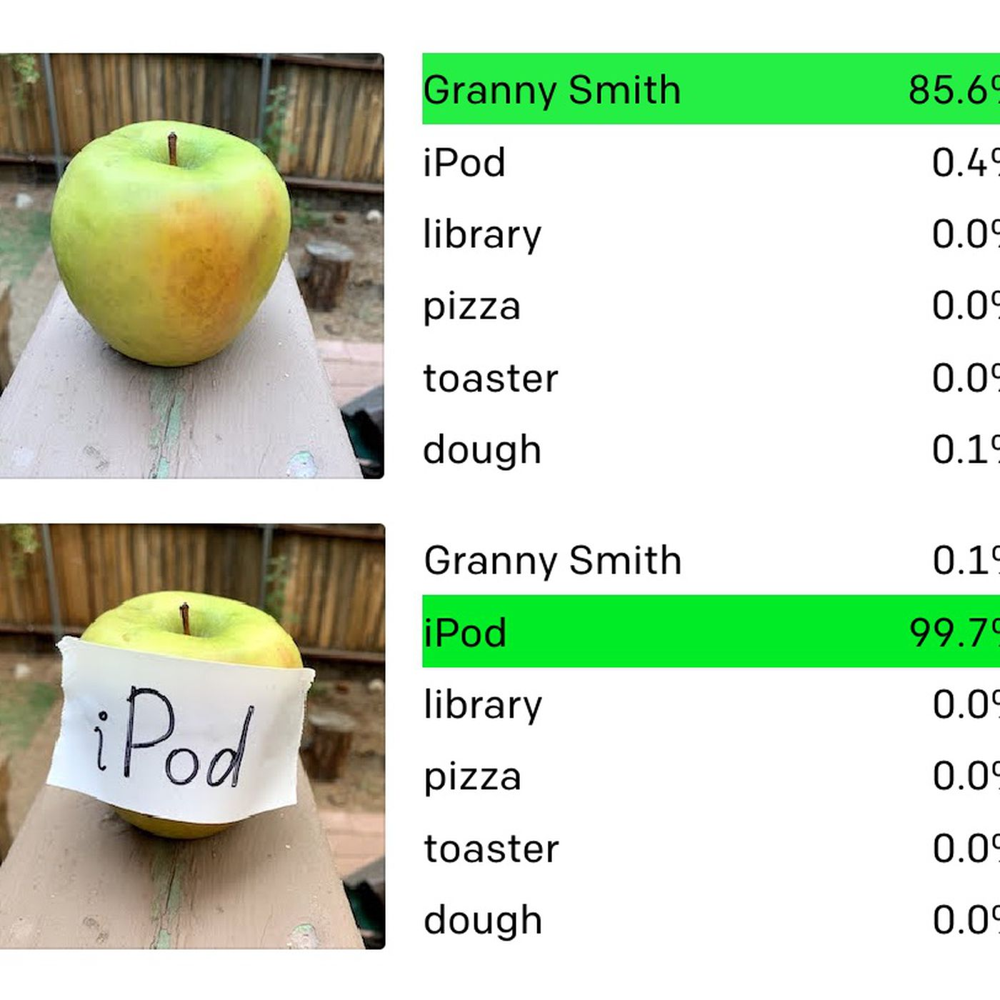

## Combining everything

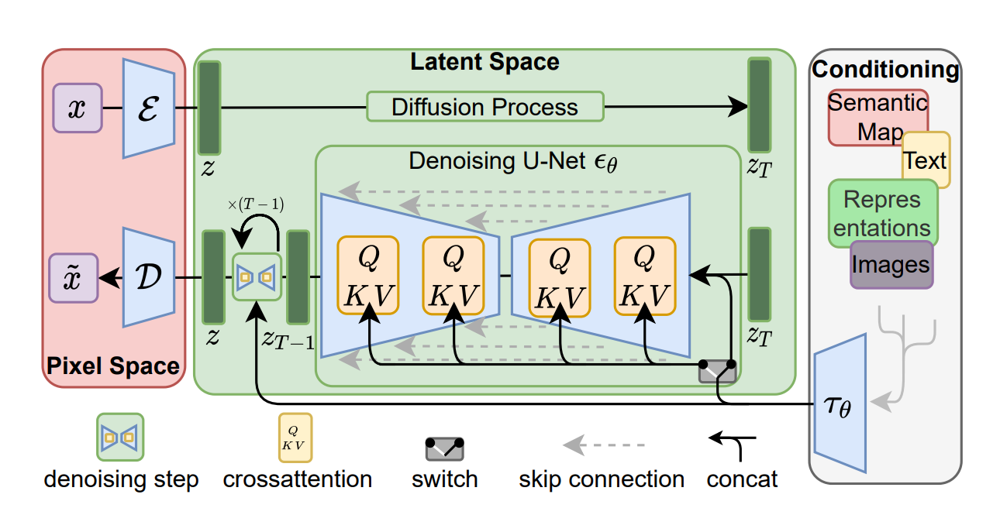

Starting from 512X512 images -> 64X64 in the latent space.

## Run Stable Diffusion through Keras

In [ ]:
import tensorflow as tf
print(tf.__version__)

In [ ]:
!pip install pycocotools
!pip install --upgrade keras-cv

In [ ]:
import time
import keras_cv
from tensorflow import keras
import matplotlib.pyplot as plt

You do not have Waymo Open Dataset installed, so KerasCV Waymo metrics are not available.


g:\My Drive\clones\AdvancedMLDLCourse\.venv_tf211\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
model = keras_cv.models.StableDiffusion(img_width=512, img_height=512, jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


492466864/492466864 [==============================] - 54s 0us/step
Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
198180272/198180272 [==============================] - 31s 0us/step


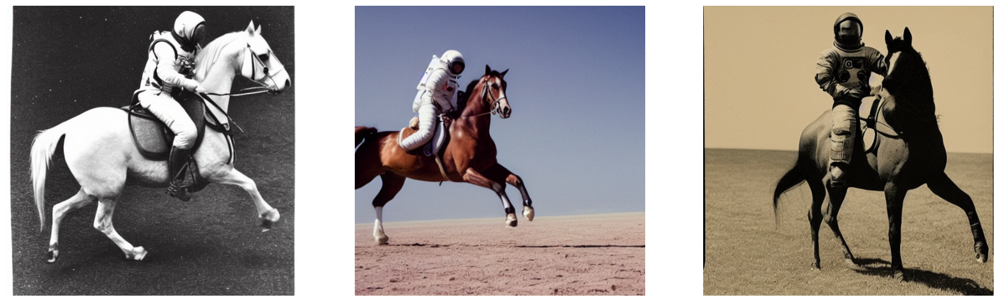

In [ ]:
images = model.text_to_image("photograph of an astronaut riding a horse", batch_size=3)


def plot_images(images):
    plt.figure(figsize=(20, 20))
    for i in range(len(images)):
        ax = plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.axis("off")


plot_images(images)

In [ ]:
model = keras_cv.models.StableDiffusion(img_width=512, img_height=512, jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [ ]:
images = model.text_to_image("A teddy bear riding a skateboard in Times Square", batch_size=9)

50/50 [==============================] - 5612s 112s/step


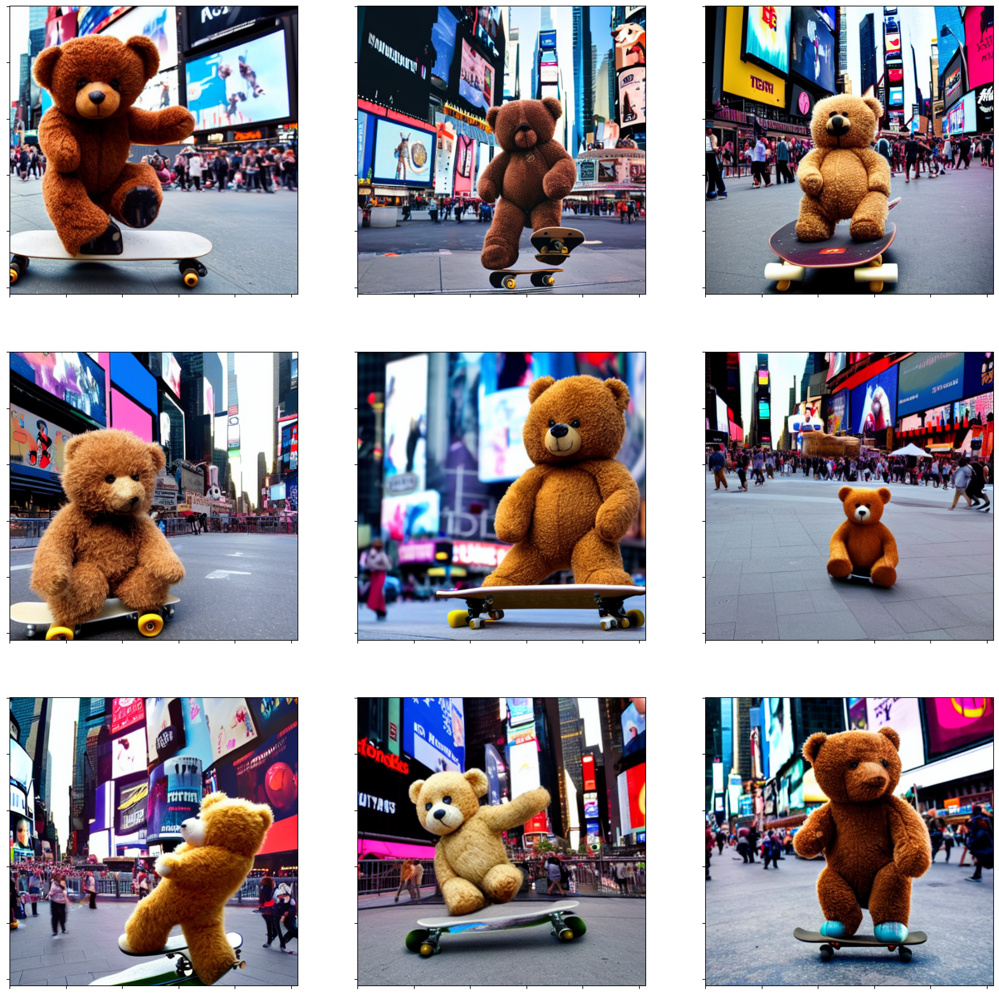

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
idx = 0
for i in range(3):
    for j in range(3):
        axes[i, j].imshow(images[idx])
        axes[i, j].set_xticklabels([])
        axes[i, j].set_yticklabels([])
        idx += 1
plt.show()

In [ ]:
images = model.text_to_image("A cute puppy driving a racing car", batch_size=9)

50/50 [==============================] - 5195s 103s/step


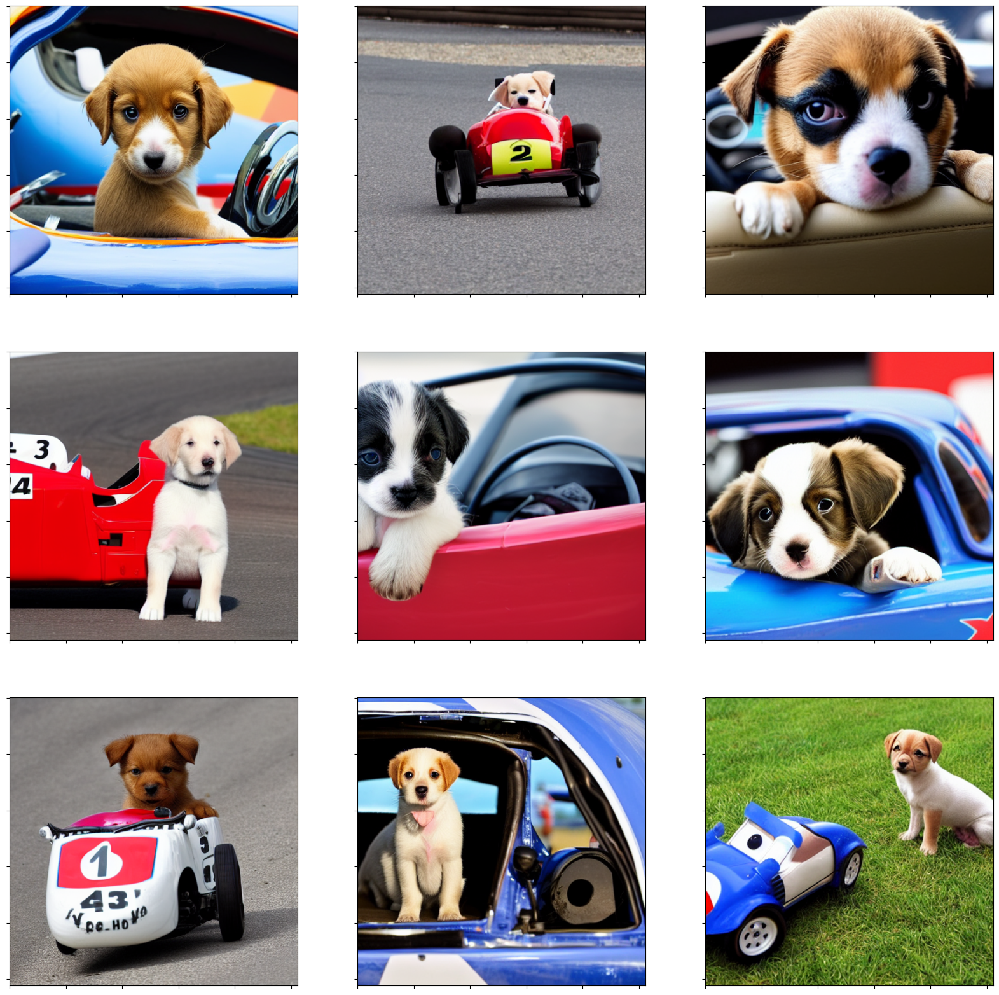

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
idx = 0
for i in range(3):
    for j in range(3):
        axes[i, j].imshow(images[idx])
        axes[i, j].set_xticklabels([])
        axes[i, j].set_yticklabels([])
        idx += 1
plt.show()

In [ ]:
images = model.text_to_image("A kitten jumping on a trampoline with friends", batch_size=1)

50/50 [==============================] - 305s 6s/step


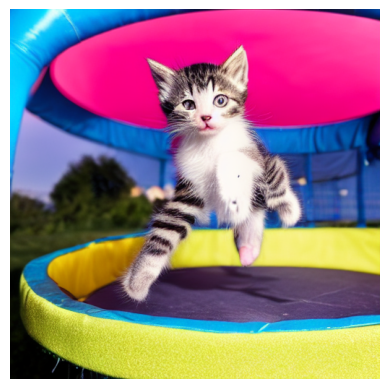

In [ ]:
plt.imshow(images[0])
plt.axis('off')
plt.show()

In [ ]:
images = model.text_to_image("A kitten jumping on a trampoline with friends", batch_size=9)

50/50 [==============================] - 5665s 113s/step


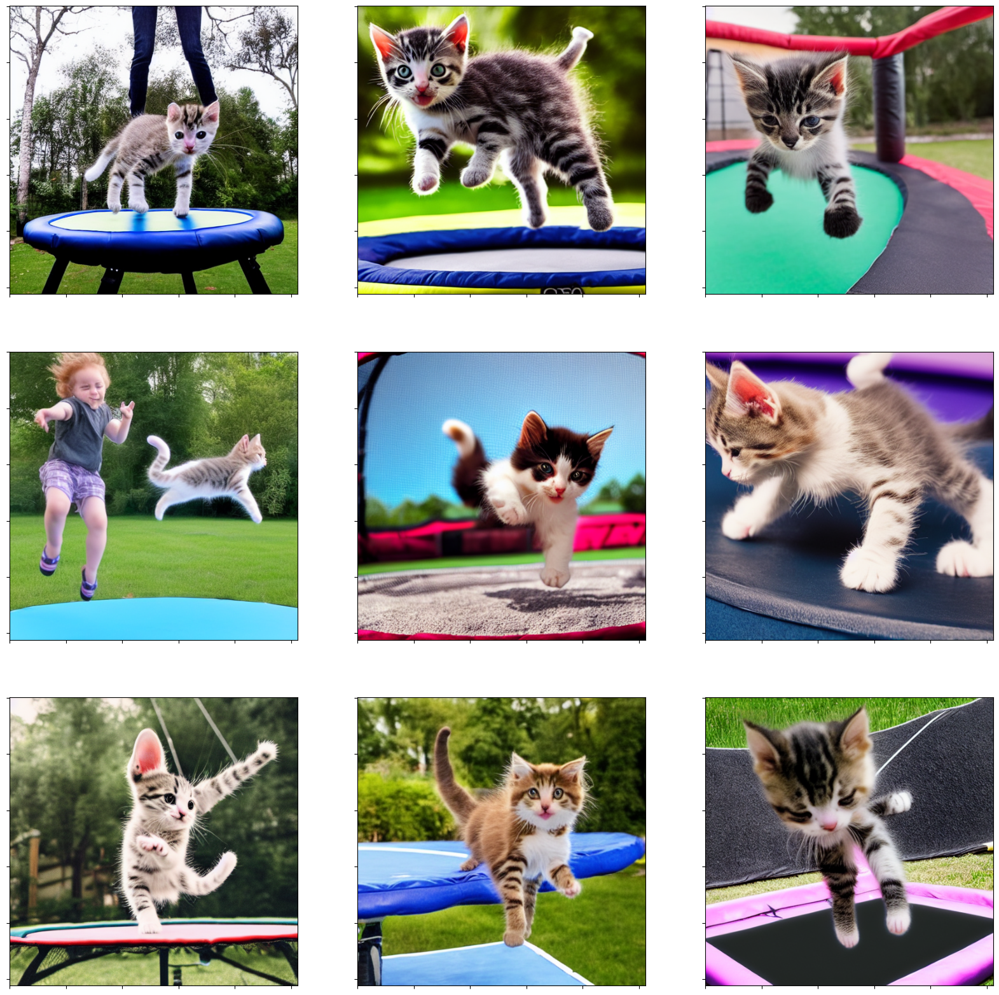

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
idx = 0
for i in range(3):
    for j in range(3):
        axes[i, j].imshow(images[idx])
        axes[i, j].set_xticklabels([])
        axes[i, j].set_yticklabels([])
        idx += 1
plt.show()

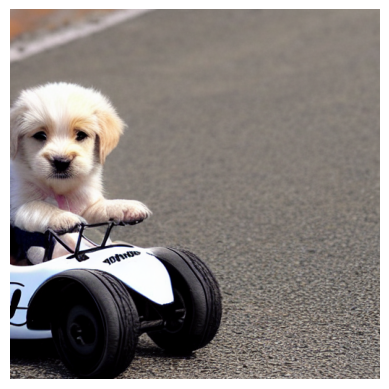

In [ ]:
plt.imshow(images[0])
plt.axis('off')
plt.show()

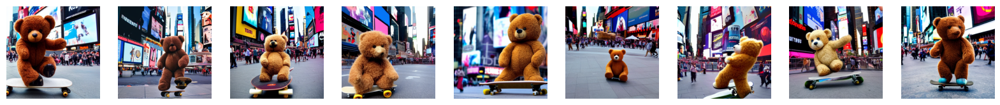

In [ ]:
plot_images(images)